# Real Estate

Real Estate represents an important thing in Saudi Arabia , so the prices of land area depends on activities and galas and so on ,
- in our project we want to know the social classes through Real Estate , so , for that we divided the classes into 4 classes depending on Price per meter square , which is : 
- 1- Upper class : which have the rich peoble or Investors 
- 2- Upper middle class : which is the middle of uper class 
- 3- lower middle class : which is middle of lower class 
- 4- lower class :  which is have the poor , resident and so on 

# Import

In [1]:
import pandas as pd
import numpy as np
import seaborn as sns
import patsy
import scipy.stats as stats

import statsmodels.api as sm
import statsmodels.formula.api as smf
from sklearn import preprocessing
from sklearn.linear_model import LinearRegression


from sklearn.metrics import mean_squared_error,r2_score
from math import sqrt
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression, Ridge #ordinary linear regression + w/ ridge regularization
from sklearn.preprocessing import StandardScaler, PolynomialFeatures

from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression, Ridge #ordinary linear regression + w/ ridge regularization
from sklearn.preprocessing import StandardScaler, PolynomialFeatures
from sklearn.datasets import make_regression
from sklearn.pipeline import make_pipeline

from sklearn.model_selection import cross_val_score
from sklearn.neighbors import KNeighborsClassifier
from sklearn import metrics


from sklearn.datasets import load_diabetes
from sklearn.linear_model import Lasso, Ridge, ElasticNet, LinearRegression

from sklearn.model_selection import (cross_val_score, train_test_split, KFold, GridSearchCV)

from sklearn.metrics import accuracy_score, confusion_matrix, classification_report


from sklearn.linear_model import LogisticRegression

from sklearn.ensemble import RandomForestClassifier
from sklearn.tree import DecisionTreeClassifier


from sklearn.metrics import f1_score, roc_auc_score,recall_score,precision_score,fbeta_score


%matplotlib inline
import matplotlib.pyplot as plt

In [2]:
df = pd.read_excel(r'2020_2021.xlsx', engine='openpyxl' )

In [3]:
df.head(5)

,City,Distract,scheme,part_number,dealing_date,dealing_Number,Price,Land_area_meter_Sqr,Price_1meter_sqr
0,الرياض,حي/أحد,مخطط/2485,قطعة 222/2,2020-09-16,10623708,"ر.س.‏ 250,000",435.0,575
1,الرياض,حي/أحد,مخطط/2485,قطعة 499/1,2020-09-25,10683677,"ر.س.‏ 250,000",480.0,521
2,الرياض,حي/أحد,مخطط/2485,عدد العقارات 2-أول ق…,2020-09-06,10539108,"ر.س.‏ 1,755,000",1800.0,975
3,الرياض,حي/أحد,مخطط/3152,قطعة 346,2020-09-29,10716322,"ر.س.‏ 350,000",87.5,4000
4,الرياض,حي/أحد,مخطط/3152,قطعة 549/1,2020-09-07,10551552,"ر.س.‏ 400,000",470.0,851


In [4]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 20615 entries, 0 to 20614
Data columns (total 9 columns):
 #   Column               Non-Null Count  Dtype         
---  ------               --------------  -----         
 0   City                 20615 non-null  object        
 1   Distract             20615 non-null  object        
 2   scheme               20615 non-null  object        
 3   part_number          20615 non-null  object        
 4   dealing_date         20615 non-null  datetime64[ns]
 5   dealing_Number       20615 non-null  int64         
 6   Price                20615 non-null  object        
 7   Land_area_meter_Sqr  20615 non-null  float64       
 8   Price_1meter_sqr     20615 non-null  int64         
dtypes: datetime64[ns](1), float64(1), int64(2), object(5)
memory usage: 1.4+ MB


# EDA

- Edit the Distract and Price Scheme columns 

In [5]:
Update_Dist = df["Distract"].str.split("/", n = 1, expand = True)
df["Distract"]= Update_Dist[1]

In [6]:

df['Price'] = df['Price'].str.replace('ر.س.', '')
df['Price'] = df['Price'].str.replace('\u200f', '')
df['Price'] = df['Price'].replace('\s+', '', regex=True)
df['Price'] = df['Price'].str.replace(',', '').astype(int)


<ipython-input-6-edf611a191e9>:1: FutureWarning: The default value of regex will change from True to False in a future version.
  df['Price'] = df['Price'].str.replace('ر.س.', '')


In [7]:
Update_Scheme = df["scheme"].str.split("/", n = 1, expand = True)
df["scheme"]= Update_Scheme[1]

In [8]:
df.drop(columns =["part_number"], inplace = True)

Drop the Columns which don't need 

In [9]:
df.drop(['scheme', 'dealing_date ','dealing_Number ','Price','City'], axis=1, inplace=True)

 - Remove some useless data 

In [10]:
df_exits_negative = df[ (df['Distract'] == 'ارضة الجو منطقة ا…' ) |
                       
                      (df['Distract'] == '57 من المخطط رقم…' )   
                       | (df['Distract'] == 'القرى' ) | (df['Distract'] == '3020/ و' )|
                       (df['Distract'] == 'أخرى' )
                      ]
                      

df = df.drop(df_exits_negative.index, axis=0) # Step 2
df

,Distract,Land_area_meter_Sqr,Price_1meter_sqr
0,أحد,435.0,575
1,أحد,480.0,521
2,أحد,1800.0,975
3,أحد,87.5,4000
4,أحد,470.0,851
...,...,...,...
20610,الجزيرة,484.0,620
20611,الجزيرة,484.0,620
20612,الجزيرة,484.0,620
20613,الجزيرة,484.0,620


Grouping the data by Distracts which is 147 Distract and taking the mean for price for 1 meter sqr (Price_1meter_sqr
)

In [11]:
Price_mean_with_Dist = df.groupby(['Distract'])[["Land_area_meter_Sqr",'Price_1meter_sqr']].mean().reset_index()


Price_mean=Price_mean_with_Dist.sort_values('Price_1meter_sqr', ascending=False).reset_index()
Price_mean

,index,Distract,Land_area_meter_Sqr,Price_1meter_sqr
0,139,ثليم,140.620000,14160.500000
1,79,الفيحاء,592.347308,8579.076923
2,21,الخزامى,1110.812500,6213.625000
3,138,تلال,720.990000,6103.000000
4,1,ابو طليحة,337.500000,5742.000000
...,...,...,...,...
162,66,العلا,958.071429,164.142857
163,149,شرق الرياض,963.228389,163.126233
164,114,النخبة,890.500000,162.375000
165,51,الشعلة,572.142857,118.428571


- 1- after we did the mean , we sort the values ascending 
- now we will take the medain for Price_1meter_sqr column 

In [12]:
medians=Price_mean.median()

1796.925000 is the median  

we divide 2 part which is  lower and upper ,
for every part has 2 class , 
1-lower 
2-Middle lower 
3- Middle upper 
4- Upper 

In [13]:
Upper=Price_mean[ (Price_mean['Price_1meter_sqr'] >= 1796.925000 )]

In [14]:
Upper_Median=Upper.median()

In [15]:
Lower=Price_mean[(Price_mean['Price_1meter_sqr'] < 1796.925000 )]

In [16]:
Lower_medians=Lower.median()

In [17]:
Price_mean

,index,Distract,Land_area_meter_Sqr,Price_1meter_sqr
0,139,ثليم,140.620000,14160.500000
1,79,الفيحاء,592.347308,8579.076923
2,21,الخزامى,1110.812500,6213.625000
3,138,تلال,720.990000,6103.000000
4,1,ابو طليحة,337.500000,5742.000000
...,...,...,...,...
162,66,العلا,958.071429,164.142857
163,149,شرق الرياض,963.228389,163.126233
164,114,النخبة,890.500000,162.375000
165,51,الشعلة,572.142857,118.428571


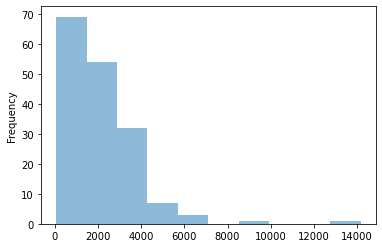

In [18]:
ax = Price_mean['Price_1meter_sqr'].plot.hist( alpha=0.5)

as we had outlier so we remove it 

In [19]:
df_Distract_Outliers = Price_mean[ (Price_mean['Price_1meter_sqr'] > 8000 ) ]
                      

Price_mean = Price_mean.drop(df_Distract_Outliers.index, axis=0) # Step 2
Price_mean

,index,Distract,Land_area_meter_Sqr,Price_1meter_sqr
2,21,الخزامى,1110.812500,6213.625000
3,138,تلال,720.990000,6103.000000
4,1,ابو طليحة,337.500000,5742.000000
5,124,الهدا,2400.711000,5397.600000
6,91,المروج,791.898696,5077.565217
...,...,...,...,...
162,66,العلا,958.071429,164.142857
163,149,شرق الرياض,963.228389,163.126233
164,114,النخبة,890.500000,162.375000
165,51,الشعلة,572.142857,118.428571


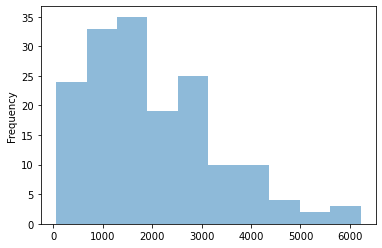

In [20]:
ax = Price_mean['Price_1meter_sqr'].plot.hist( alpha=0.5)

- now we will take get dummy varibales for Distract 

In [21]:
mask1=pd.get_dummies(Price_mean, columns=['Distract'])

as we say divided into 4 part 

1-lower we will take 0

2-Middle lower we will take 1




3- Middle upper we will take 2




4-Upper we will take 3

In [22]:
mask1.loc[mask1['Price_1meter_sqr'] >= 2778  , 'social_class'] = 3


mask1.loc[(mask1['Price_1meter_sqr'] >= 1796) & (mask1['Price_1meter_sqr']  <2778) , 'social_class'] = 2



mask1.loc[(mask1['Price_1meter_sqr'] >= 486) & (mask1['Price_1meter_sqr']  <1796) , 'social_class'] = 1



mask1.loc[mask1['Price_1meter_sqr']<486 , 'social_class'] = 0


In [23]:
mask1

,index,Land_area_meter_Sqr,Price_1meter_sqr,Distract_أحد,Distract_ابو طليحة,Distract_اسكان الجزيره,Distract_اشبيليا,Distract_الازدهار,Distract_الامانة,Distract_الاندلس,...,Distract_غبيراء,Distract_غرناطة,Distract_قرطبة,Distract_لبن,Distract_مدائن الفهد,Distract_مطار الملك خالد ا…,Distract_معكال,Distract_منفوحة,Distract_نمار,social_class
2,21,1110.812500,6213.625000,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,3.0
3,138,720.990000,6103.000000,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,3.0
4,1,337.500000,5742.000000,0,1,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,3.0
5,124,2400.711000,5397.600000,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,3.0
6,91,791.898696,5077.565217,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,3.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
162,66,958.071429,164.142857,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0.0
163,149,963.228389,163.126233,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0.0
164,114,890.500000,162.375000,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0.0
165,51,572.142857,118.428571,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0.0


In [24]:
# conda install -c conda-forge pandas-profiling


In [25]:
mask1['social_class'].unique

<bound method Series.unique of 2      3.0
3      3.0
4      3.0
5      3.0
6      3.0
      ... 
162    0.0
163    0.0
164    0.0
165    0.0
166    0.0
Name: social_class, Length: 165, dtype: float64>

In [26]:
from pandas_profiling import ProfileReport
pro=ProfileReport(mask1)
pro

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [27]:
mask1['index'] = mask1.index

as we see it is  Impalance class 0 has 19 

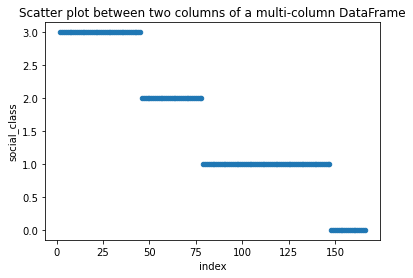

In [28]:
# Load data into pandas DataFrame       


%matplotlib inline
import matplotlib.pyplot as plt

# Draw a scatter plot

mask1.plot.scatter(x='index', y='social_class', title= "Scatter plot between two columns of a multi-column DataFrame");



In [29]:
mask_copy = mask1.copy()

In [30]:
mask_copy

,index,Land_area_meter_Sqr,Price_1meter_sqr,Distract_أحد,Distract_ابو طليحة,Distract_اسكان الجزيره,Distract_اشبيليا,Distract_الازدهار,Distract_الامانة,Distract_الاندلس,...,Distract_غبيراء,Distract_غرناطة,Distract_قرطبة,Distract_لبن,Distract_مدائن الفهد,Distract_مطار الملك خالد ا…,Distract_معكال,Distract_منفوحة,Distract_نمار,social_class
2,2,1110.812500,6213.625000,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,3.0
3,3,720.990000,6103.000000,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,3.0
4,4,337.500000,5742.000000,0,1,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,3.0
5,5,2400.711000,5397.600000,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,3.0
6,6,791.898696,5077.565217,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,3.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
162,162,958.071429,164.142857,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0.0
163,163,963.228389,163.126233,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0.0
164,164,890.500000,162.375000,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0.0
165,165,572.142857,118.428571,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0.0


In [31]:
y = mask_copy['social_class']
X = mask_copy.drop(['social_class'],axis=1)

In [32]:
len(y)

165

In [33]:
len(X)

165

# Split

In [34]:
# Split into train, val, and test

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=40)
X_train, X_val, y_train, y_val = train_test_split(X_train, y_train, test_size=0.25, random_state=40)


In [35]:
X_train

,index,Land_area_meter_Sqr,Price_1meter_sqr,Distract_أحد,Distract_ابو طليحة,Distract_اسكان الجزيره,Distract_اشبيليا,Distract_الازدهار,Distract_الامانة,Distract_الاندلس,...,Distract_عليشة,Distract_غبيراء,Distract_غرناطة,Distract_قرطبة,Distract_لبن,Distract_مدائن الفهد,Distract_مطار الملك خالد ا…,Distract_معكال,Distract_منفوحة,Distract_نمار
137,137,346.835000,867.500000,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
21,21,540.850000,3745.363636,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
83,83,474.800000,1639.000000,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
96,96,457.017514,1481.265193,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
61,61,606.229091,2319.863636,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
88,88,428.738462,1564.153846,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
50,50,366.622500,2703.750000,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
31,31,1963.000000,3070.000000,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
40,40,300.000000,3000.000000,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [36]:
len(y_test)

33

# Scalar

In [37]:
scaler = StandardScaler()

X_train_scaled = scaler.fit_transform(X_train)

X_val_scaled = scaler.transform(X_val)

# Exper 1 -Logistic regression -Scalar

In [38]:
lr_scale = LogisticRegression(C=100) 
lr_scale.fit(X_train_scaled, y_train)
y_pred_val_lr_scale = lr_scale.predict(X_val_scaled)





print("weighted-Pres Score ", metrics.precision_score(y_val, y_pred_val_lr_scale,pos_label='positive',average='weighted'))
print("weighted-Recall Score ", metrics.recall_score(y_val, y_pred_val_lr_scale,pos_label='positive',average='weighted'))
print("weighted-Recall Score ", metrics.fbeta_score(y_val, y_pred_val_lr_scale,pos_label='positive',average='weighted',beta=0))
print("Validation Score ", metrics.accuracy_score(y_val, y_pred_val_lr_scale))
print('Accuracy on training set:',lr_scale.score(X_train_scaled, y_train))



weighted-Pres Score  0.418081918081918
weighted-Recall Score  0.6363636363636364
weighted-Recall Score  0.418081918081918
Validation Score  0.6363636363636364
Accuracy on training set: 1.0


/Users/ezzowali/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1295: UserWarning: Note that pos_label (set to 'positive') is ignored when average != 'binary' (got 'weighted'). You may use labels=[pos_label] to specify a single positive class.
  warnings.warn("Note that pos_label (set to %r) is ignored when "
/Users/ezzowali/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1245: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/Users/ezzowali/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1295: UserWarning: Note that pos_label (set to 'positive') is ignored when average != 'binary' (got 'weighted'). You may use labels=[pos_label] to specify a single positive class.
  warnings.warn("Note that pos_label (set to %r) is ignored when "
/Us

# Exper-2 : Random Forest -Scalar

In [39]:
rf_clf_sca = RandomForestClassifier()


rf_clf_sca.fit(X_train_scaled, y_train)
y_pred_rf_scalar = rf_clf_sca.predict(X_val_scaled)




print("weighted-Pres Score ", metrics.precision_score(y_val, y_pred_rf_scalar,pos_label='positive',average='weighted'))
print("weighted-Recall Score ", metrics.recall_score(y_val, y_pred_rf_scalar,pos_label='positive',average='weighted'))
print("weighted-Fbeta Score ", metrics.fbeta_score(y_val, y_pred_rf_scalar,pos_label='positive',average='weighted',beta=0))
print('-----------')
print("Validation Score ", metrics.accuracy_score(y_val, y_pred_rf_scalar))
print('Accuracy on training set:',rf_clf_sca.score(X_train_scaled, y_train))



weighted-Pres Score  0.9740259740259739
weighted-Recall Score  0.9696969696969697
weighted-Fbeta Score  0.9740259740259739
-----------
Validation Score  0.9696969696969697
Accuracy on training set: 1.0


/Users/ezzowali/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1295: UserWarning: Note that pos_label (set to 'positive') is ignored when average != 'binary' (got 'weighted'). You may use labels=[pos_label] to specify a single positive class.
  warnings.warn("Note that pos_label (set to %r) is ignored when "
/Users/ezzowali/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1295: UserWarning: Note that pos_label (set to 'positive') is ignored when average != 'binary' (got 'weighted'). You may use labels=[pos_label] to specify a single positive class.
  warnings.warn("Note that pos_label (set to %r) is ignored when "
/Users/ezzowali/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1295: UserWarning: Note that pos_label (set to 'positive') is ignored when average != 'binary' (got 'weighted'). You may use labels=[pos_label] to specify a single positive class.
  warnings.warn("Note that pos_label (set to %r

In [40]:
print(classification_report(y_val, y_pred_rf_scalar))

              precision    recall  f1-score   support

         0.0       1.00      1.00      1.00         6
         1.0       1.00      0.93      0.97        15
         2.0       0.86      1.00      0.92         6
         3.0       1.00      1.00      1.00         6

    accuracy                           0.97        33
   macro avg       0.96      0.98      0.97        33
weighted avg       0.97      0.97      0.97        33



wow ranomForst is great 

In [41]:

models = {
   
    "KNeighborsClassifier":{"model":KNeighborsClassifier() },
    "LogisticRegression":{"model":LogisticRegression() },
    
    "RandomForestClassifier":{"model":RandomForestClassifier() },
    "DecisionTreeClassifier":{"model":DecisionTreeClassifier() }
}

for model_name, m in models.items():
    m['model'].fit(X_train_scaled, y_train)
    test_acc = m['model'].score(X_val_scaled,y_val)
    m['test_acc'] = test_acc
    print(f"{model_name} - Valid acc: {test_acc*100:.2f}%")

KNeighborsClassifier - Valid acc: 90.91%
LogisticRegression - Valid acc: 63.64%
RandomForestClassifier - Valid acc: 96.97%
DecisionTreeClassifier - Valid acc: 96.97%


# ImBalance 

as we see there some impalance , we will use impalance on Log reg and use scale on log reg

In [42]:
# !conda install -c conda-forge imbalanced-learn

import imblearn.over_sampling

# setup for the ratio argument of RandomOverSampler initialization

n0 = np.sum(y_train == 0)
n2 = np.sum(y_train == 2)
n3 = np.sum(y_train == 3)
n1 = np.sum(y_train == 1)
ratio = {0 : n0 * 2,
         2 : n2,
         3:n3,
         1:n1
        
         
        } 

# randomly oversample positive samples: create 4x as many 
ROS = imblearn.over_sampling.RandomOverSampler(sampling_strategy = ratio, random_state=40) 
    
X_train_ROS, y_train_ROS = ROS.fit_resample(X_train, y_train)





Text(0, 0.5, 'Predictions')

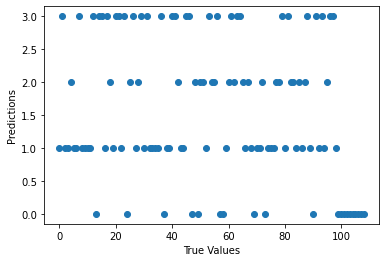

In [52]:
plt.scatter(X_train_ROS.index,  y_train_ROS)
plt.xlabel('True Values')
plt.ylabel('Predictions')

Text(0, 0.5, 'Predictions')

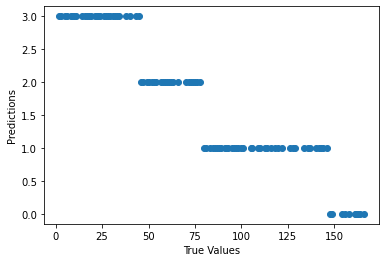

In [51]:
plt.scatter(X_train.index,  y_train)
plt.xlabel('True Values')
plt.ylabel('Predictions')

# Exper3 : Log reg-impalance 

In [43]:
lr_os = LogisticRegression(class_weight='balanced',solver='liblinear') 
lr_os.fit(X_train_ROS, y_train_ROS)
y_pred_val_lr = lr_os.predict(X_val)





print("weighted-Pres Score ", metrics.precision_score(y_val, y_pred_val_lr,pos_label='positive',average='weighted'))
print("weighted-Recall Score ", metrics.recall_score(y_val, y_pred_val_lr,pos_label='positive',average='weighted'))
print("weighted-Fbeta Score ", metrics.fbeta_score(y_val, y_pred_val_lr,pos_label='positive',average='weighted',beta=0))
print("Validation Score ", metrics.accuracy_score(y_val, y_pred_val_lr))
print('Accuracy on training set:',lr_os.score(X_train_ROS, y_train_ROS))



weighted-Pres Score  0.946524064171123
weighted-Recall Score  0.9393939393939394
weighted-Fbeta Score  0.946524064171123
Validation Score  0.9393939393939394
Accuracy on training set: 1.0


/Users/ezzowali/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1295: UserWarning: Note that pos_label (set to 'positive') is ignored when average != 'binary' (got 'weighted'). You may use labels=[pos_label] to specify a single positive class.
  warnings.warn("Note that pos_label (set to %r) is ignored when "
/Users/ezzowali/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1295: UserWarning: Note that pos_label (set to 'positive') is ignored when average != 'binary' (got 'weighted'). You may use labels=[pos_label] to specify a single positive class.
  warnings.warn("Note that pos_label (set to %r) is ignored when "
/Users/ezzowali/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1295: UserWarning: Note that pos_label (set to 'positive') is ignored when average != 'binary' (got 'weighted'). You may use labels=[pos_label] to specify a single positive class.
  warnings.warn("Note that pos_label (set to %r

In [44]:
print(classification_report(y_val, y_pred_val_lr))

              precision    recall  f1-score   support

         0.0       1.00      1.00      1.00         6
         1.0       0.88      1.00      0.94        15
         2.0       1.00      0.67      0.80         6
         3.0       1.00      1.00      1.00         6

    accuracy                           0.94        33
   macro avg       0.97      0.92      0.93        33
weighted avg       0.95      0.94      0.94        33




# Exper 4 : Knn-impalance 

In [45]:



knn_im = KNeighborsClassifier(n_neighbors=5)
knn_im.fit(X_train_ROS, y_train_ROS)
y_pred_val_knn_im = knn_im.predict(X_val)





print("weighted-Pres Score ", metrics.precision_score(y_val, y_pred_val_knn_im,pos_label='positive',average='weighted'))
print("weighted-Recall Score ", metrics.recall_score(y_val, y_pred_val_knn_im,pos_label='positive',average='weighted'))
print("weighted-Fbeta Score ", metrics.fbeta_score(y_val, y_pred_val_knn_im,pos_label='positive',average='weighted',beta=0))
print('///')
print("Validation Score ", metrics.accuracy_score(y_val, y_pred_val_knn_im))
print('Accuracy on training set:',knn_im.score(X_train_ROS, y_train_ROS))

weighted-Pres Score  0.948051948051948
weighted-Recall Score  0.9393939393939394
weighted-Fbeta Score  0.948051948051948
///
Validation Score  0.9393939393939394
Accuracy on training set: 0.9541284403669725


/Users/ezzowali/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1295: UserWarning: Note that pos_label (set to 'positive') is ignored when average != 'binary' (got 'weighted'). You may use labels=[pos_label] to specify a single positive class.
  warnings.warn("Note that pos_label (set to %r) is ignored when "
/Users/ezzowali/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1295: UserWarning: Note that pos_label (set to 'positive') is ignored when average != 'binary' (got 'weighted'). You may use labels=[pos_label] to specify a single positive class.
  warnings.warn("Note that pos_label (set to %r) is ignored when "
/Users/ezzowali/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1295: UserWarning: Note that pos_label (set to 'positive') is ignored when average != 'binary' (got 'weighted'). You may use labels=[pos_label] to specify a single positive class.
  warnings.warn("Note that pos_label (set to %r

In [47]:
print(classification_report(y_val, y_pred_val_knn_im))

              precision    recall  f1-score   support

         0.0       0.86      1.00      0.92         6
         1.0       1.00      0.87      0.93        15
         2.0       0.86      1.00      0.92         6
         3.0       1.00      1.00      1.00         6

    accuracy                           0.94        33
   macro avg       0.93      0.97      0.94        33
weighted avg       0.95      0.94      0.94        33



# Exper 5 : RandomForestClassifier-impalance 

In [48]:
rf_clf = RandomForestClassifier()


rf_clf.fit(X_train_ROS, y_train_ROS)
y_pred_rf_ROS = rf_clf.predict(X_val)




print("weighted-Pres Score ", metrics.precision_score(y_val, y_pred_rf_ROS,pos_label='positive',average='weighted'))
print("weighted-Recall Score ", metrics.recall_score(y_val, y_pred_rf_ROS,pos_label='positive',average='weighted'))
print("weighted-Fbeta Score ", metrics.fbeta_score(y_val, y_pred_rf_ROS,pos_label='positive',average='weighted',beta=0))
print('///')
print("Validation Score ", metrics.accuracy_score(y_val, y_pred_rf_ROS))
print('Accuracy on training set:',rf_clf.score(X_train_ROS, y_train_ROS))

weighted-Pres Score  0.9740259740259739
weighted-Recall Score  0.9696969696969697
weighted-Fbeta Score  0.9740259740259739
///
Validation Score  0.9696969696969697
Accuracy on training set: 1.0


/Users/ezzowali/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1295: UserWarning: Note that pos_label (set to 'positive') is ignored when average != 'binary' (got 'weighted'). You may use labels=[pos_label] to specify a single positive class.
  warnings.warn("Note that pos_label (set to %r) is ignored when "
/Users/ezzowali/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1295: UserWarning: Note that pos_label (set to 'positive') is ignored when average != 'binary' (got 'weighted'). You may use labels=[pos_label] to specify a single positive class.
  warnings.warn("Note that pos_label (set to %r) is ignored when "
/Users/ezzowali/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1295: UserWarning: Note that pos_label (set to 'positive') is ignored when average != 'binary' (got 'weighted'). You may use labels=[pos_label] to specify a single positive class.
  warnings.warn("Note that pos_label (set to %r

# Exper 6 : DecisionTreeClassifier-impalance 

In [49]:
dt = DecisionTreeClassifier()
dt.fit(X_train_ROS, y_train_ROS)
y_pred_dt_imba = dt.predict(X_val)

print("weighted-Pres Score ", metrics.precision_score(y_val, y_pred_dt_imba,pos_label='positive',average='weighted'))
print("weighted-Recall Score ", metrics.recall_score(y_val, y_pred_dt_imba,pos_label='positive',average='weighted'))
print("weighted-Fbeta Score ", metrics.fbeta_score(y_val, y_pred_dt_imba,pos_label='positive',average='weighted',beta=0))
print('///')
print("Validation Score ", metrics.accuracy_score(y_val, y_pred_dt_imba))
print('Accuracy on training set:',dt.score(X_train_ROS, y_train_ROS))



weighted-Pres Score  0.9740259740259739
weighted-Recall Score  0.9696969696969697
weighted-Fbeta Score  0.9740259740259739
///
Validation Score  0.9696969696969697
Accuracy on training set: 1.0


/Users/ezzowali/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1295: UserWarning: Note that pos_label (set to 'positive') is ignored when average != 'binary' (got 'weighted'). You may use labels=[pos_label] to specify a single positive class.
  warnings.warn("Note that pos_label (set to %r) is ignored when "
/Users/ezzowali/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1295: UserWarning: Note that pos_label (set to 'positive') is ignored when average != 'binary' (got 'weighted'). You may use labels=[pos_label] to specify a single positive class.
  warnings.warn("Note that pos_label (set to %r) is ignored when "
/Users/ezzowali/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1295: UserWarning: Note that pos_label (set to 'positive') is ignored when average != 'binary' (got 'weighted'). You may use labels=[pos_label] to specify a single positive class.
  warnings.warn("Note that pos_label (set to %r

In [50]:
print(classification_report(y_val, y_pred_dt_imba))

              precision    recall  f1-score   support

         0.0       1.00      1.00      1.00         6
         1.0       1.00      0.93      0.97        15
         2.0       0.86      1.00      0.92         6
         3.0       1.00      1.00      1.00         6

    accuracy                           0.97        33
   macro avg       0.96      0.98      0.97        33
weighted avg       0.97      0.97      0.97        33



# we choose RandomForest Model 

In [51]:
rf_clf = RandomForestClassifier()


rf_clf.fit(X_train_ROS, y_train_ROS)

predect = rf_clf.predict(X_test)



In [57]:
y_test

25     3.0
153    0.0
141    1.0
68     2.0
42     3.0
7      3.0
55     2.0
121    1.0
102    1.0
48     2.0
155    0.0
138    1.0
37     3.0
99     1.0
111    1.0
108    1.0
20     3.0
115    1.0
44     3.0
125    1.0
131    1.0
30     3.0
123    1.0
69     2.0
107    1.0
13     3.0
145    1.0
130    1.0
150    0.0
39     3.0
127    1.0
56     2.0
132    1.0
Name: social_class, dtype: float64

In [52]:
Test_Set = pd.DataFrame(y_test).join(X_test)


Test_Set['Predicted Est'] = predect
Test_Set.reset_index(inplace=True)
Test_Set.drop('index',axis=1,inplace=True)
Test_Set

,level_0,social_class,Land_area_meter_Sqr,Price_1meter_sqr,Distract_أحد,Distract_ابو طليحة,Distract_اسكان الجزيره,Distract_اشبيليا,Distract_الازدهار,Distract_الامانة,...,Distract_غبيراء,Distract_غرناطة,Distract_قرطبة,Distract_لبن,Distract_مدائن الفهد,Distract_مطار الملك خالد ا…,Distract_معكال,Distract_منفوحة,Distract_نمار,Predicted Est
0,25,3.0,859.258276,3353.413793,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,3.0
1,153,0.0,630.000000,340.000000,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0.0
2,141,1.0,455.120256,825.153846,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,1.0
3,68,2.0,92.400000,1948.000000,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,2.0
4,42,3.0,635.686000,2952.654545,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,3.0
5,7,3.0,680.261667,4747.500000,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,3.0
6,55,2.0,489.580968,2529.354839,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,2.0
7,121,1.0,911.250000,1097.000000,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,1.0
8,102,1.0,461.236179,1356.569106,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,1.0
9,48,2.0,635.101304,2733.195652,0,0,0,0,0,0,...,0,0,1,0,0,0,0,0,0,2.0


In [53]:
LAST = Test_Set[['social_class', 'Land_area_meter_Sqr', 'Price_1meter_sqr', 'Predicted Est']]
LAST

,social_class,Land_area_meter_Sqr,Price_1meter_sqr,Predicted Est
0,3.0,859.258276,3353.413793,3.0
1,0.0,630.000000,340.000000,0.0
2,1.0,455.120256,825.153846,1.0
3,2.0,92.400000,1948.000000,2.0
4,3.0,635.686000,2952.654545,3.0
5,3.0,680.261667,4747.500000,3.0
6,2.0,489.580968,2529.354839,2.0
7,1.0,911.250000,1097.000000,1.0
8,1.0,461.236179,1356.569106,1.0
9,2.0,635.101304,2733.195652,2.0


In [54]:

rf_clf = RandomForestClassifier()


rf_clf.fit(X_train_ROS, y_train_ROS)

predect = rf_clf.predict(X_test)




print("weighted-Pres Score ", metrics.precision_score(y_test, predect,pos_label='positive',average='weighted'))
print("weighted-Recall Score ", metrics.recall_score(y_test, predect,pos_label='positive',average='weighted'))
print("weighted-Fbeta Score ", metrics.fbeta_score(y_test, predect,pos_label='positive',average='weighted',beta=0))
print('///')
print("Validation Score ", metrics.accuracy_score(y_test, predect))
print('Accuracy on training set:',rf_clf.score(X_train_ROS, y_train_ROS))



weighted-Pres Score  1.0
weighted-Recall Score  1.0
weighted-Fbeta Score  1.0
///
Validation Score  1.0
Accuracy on training set: 1.0


/Users/ezzowali/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1295: UserWarning: Note that pos_label (set to 'positive') is ignored when average != 'binary' (got 'weighted'). You may use labels=[pos_label] to specify a single positive class.
  warnings.warn("Note that pos_label (set to %r) is ignored when "
/Users/ezzowali/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1295: UserWarning: Note that pos_label (set to 'positive') is ignored when average != 'binary' (got 'weighted'). You may use labels=[pos_label] to specify a single positive class.
  warnings.warn("Note that pos_label (set to %r) is ignored when "
/Users/ezzowali/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1295: UserWarning: Note that pos_label (set to 'positive') is ignored when average != 'binary' (got 'weighted'). You may use labels=[pos_label] to specify a single positive class.
  warnings.warn("Note that pos_label (set to %r